# **Example Usage of SolarAlignmentPy Library**

This Jupyter Notebook is designed to demonstrate the practical uses of the `SolarAlignmentPy` library. Here, we will walk through various functions provided by the library, showcasing how to apply them to solar image data. We'll cover everything from setting up your environment, loading data, performing image alignment and analysis, to visualizing the results. Whether you're a researcher, student, or enthusiast in the field of solar physics, this guide will help you get started with `SolarAlignmentPy` effectively.

By the end of this notebook, you should have a clear understanding of how to integrate and utilize `SolarAlignmentPy` in your own projects, leveraging its capabilities to enhance your research or studies.

**Note:** Ensure you have the library installed and all necessary dependencies before beginning.

---
For more details on the process, see:
**Method article**: 'https://arxiv.org/abs/2404.04401',

**Second chapter of my master's thesis** for more details than in the paper: 'https://repositorio.unal.edu.co/handle/unal/85838'.

---
**F. J. Ordonez Araujo (fordonezaraujo@gmail.com)**

**J. C Guevara Gomez (juancamilo.guevaragomez@gmail.com)**

**May 9, 2024 :)**

In [3]:
import os
import glob 
import numpy as np 
import astropy.units as u
from astropy.io import fits
import matplotlib.pyplot as plt
import solar_alignment_py as sap  # Import Library 
import matplotlib.image as mpimg
from astropy.time import Time
from datetime import  date, datetime
from astropy.coordinates import SkyCoord

##  **Data Employed in the Alignment Process**

We used observations from ALMA, IRIS, and SDO in regions that were **co-observed** by these telescopes. We used data from : 

* The `ALMA Science Archive (SALSA)` is available [SALSA-DATA-BASE](http://sdc.uio.no/salsa/). Additionally, our library also incorporates the SALAT library. Within this database, you can identify regions that were co-observed by IRIS, ALMA, and SDO.

* The `INTERFACE REGION IMAGING SPECTROGRAPH (IRIS)` can be accessed [IRIS DATA SEARCH](https://iris.lmsal.com/search/).
* `Solar Dynamics Observatory` observations are available from the [Joint Science Operations Center (JSOC)](http://jsoc.stanford.edu/). In this code, we have written a function `get_query_sdo` that allows downloading SDO images by tracking a small window centered in the helioprojective coordinates specified by the user. This function utilizes the JSOC database. Below and example how to used `get_query_sdo` function and data type.



### **Script to download SDO images** 

In [4]:
t_0, t_f    = '2018-04-12T15:50:01.00', '2018-04-12T16:25:41.00'
date_format = "%Y-%m-%dT%H:%M:%S.%f"
Tx, Ty      = -128.0, -400.0  # arcsec
aiasq       =  68.31 #arcsec
start_time  = datetime.strptime(t_0, date_format)
ends_time   = datetime.strptime(t_f, date_format)
top_right   = SkyCoord((Tx+aiasq)*u.arcsec, (Ty+aiasq)*u.arcsec, obstime=start_time, observer="earth", frame="helioprojective")
bottom_left = SkyCoord((Tx-aiasq)*u.arcsec, (Ty-aiasq)*u.arcsec, obstime=start_time, observer="earth", frame="helioprojective")

In [5]:
sap.get_query_sdo

<function solar_alignment_py.myfunctions.get_query_sdo(item, bottom_left, top_right, start_time, ends_time, email)>

In [6]:
# The email address should be registered in the JSOC database.

query_data= sap.get_query_sdo('dopplergram', bottom_left, top_right, start_time, ends_time, email= 'user_email@gmail.com')
print(query_data)
#file_download = Fido.fetch(query_data, path='test_data/') #download query_data

dopplergram, cadence: 45
Results from 1 Provider:

48 Results from the JSOCClient:
Source: http://jsoc.stanford.edu

         T_REC          TELESCOP  INSTRUME  WAVELNTH CAR_ROT
----------------------- -------- ---------- -------- -------
2018.04.12_15:51:00_TAI  SDO/HMI HMI_FRONT2   6173.0    2202
2018.04.12_15:51:45_TAI  SDO/HMI HMI_FRONT2   6173.0    2202
2018.04.12_15:52:30_TAI  SDO/HMI HMI_FRONT2   6173.0    2202
2018.04.12_15:53:15_TAI  SDO/HMI HMI_FRONT2   6173.0    2202
2018.04.12_15:54:00_TAI  SDO/HMI HMI_FRONT2   6173.0    2202
2018.04.12_15:54:45_TAI  SDO/HMI HMI_FRONT2   6173.0    2202
2018.04.12_15:55:30_TAI  SDO/HMI HMI_FRONT2   6173.0    2202
2018.04.12_15:56:15_TAI  SDO/HMI HMI_FRONT2   6173.0    2202
2018.04.12_15:57:00_TAI  SDO/HMI HMI_FRONT2   6173.0    2202
2018.04.12_15:57:45_TAI  SDO/HMI HMI_FRONT2   6173.0    2202
                    ...      ...        ...      ...     ...
2018.04.12_16:18:45_TAI  SDO/HMI HMI_FRONT2   6173.0    2202
2018.04.12_16:19:30_TAI  SDO/

### **Data preparation  and some warnings** 

Users should download data of  regions that were co-observed simultaneity for  the telecopes (SDO, IRIS, ALMA). Also, my program  takes as reference SDO heliprojective coordinate, and due this the FoV of SDO crop images should have a larger than  IRIS or ALMA images (or larger than both if you want to align ALMA-IRIS and SDO images) but NOT too large because it would make that the program takes long times stimating a huge number of Pearson and SSIM coeeffients making the program more computationally expensive. We will used  In this example we used **DO6** observation from [SALSA-DATA-BASE](http://sdc.uio.no/salsa/) its FoV is 76arcsec x 76arcsec, `IRIS` observations have a FoV of 128.5 arcsec×122.0 arcsec. We strategically download `SDO` images with a crop its FoV is  137 arcsec x arcsec.  Becarefull FoVSDO 


**Data Utilized in the Alignment Process**

Users are advised to download data from regions that were co-observed simultaneously by the telescopes (SDO, IRIS, ALMA).
Additionally, my program uses `SDO` helioprojective coordinates as a reference. Consequently, the field of view (FoV) of SDO cropped images should be larger than that of `IRIS` or `ALMA` images (or larger than both if aligning `ALMA-IRIS` an `SDO` images). However, **it is important NOT to make the FoV too large, as this would result in longer processing times due to the estimation of a high number of Pearson and SSIM coefficients, making the program more computationally expensive**.

In this example, we utilized **DO6** observations from the [SALSA-DATA-BASE](http://sdc.uio.no/salsa/), with a FoV of 76 arcsec x 76 arcsec. `IRIS` observations have a FoV of 128.5 arcsec × 122.0 arcsec. We strategically downloaded `SDO` images with a cropped FoV of 137 arcsec x arcsec. As you can observe in panel (a) of the figure below.



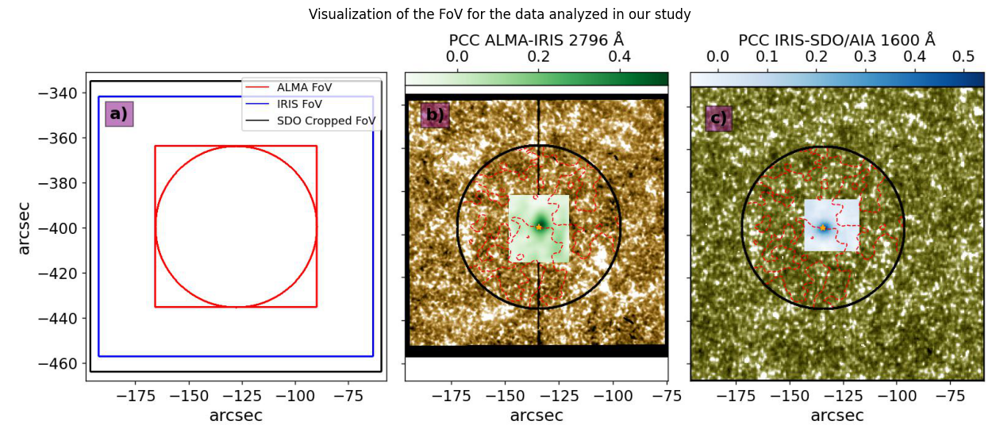

In [7]:
img = mpimg.imread('FoV_DATA_USED.jpg')
plt.figure(figsize=(16,8), dpi=100)
plt.title('Visualization of the FoV for the data analyzed in our study')
plt.imshow(img)
plt.axis('off') 
plt.show()

Visualization of the FoV for the data analyzed in our study, along with PCC
correlation matrices. 

`In panel a)`, the fields of view for SDO, IRIS, and ALMA
are highlighted in black, blue, and red, respectively. 

`In panel b)`, an IRIS 2796
frame is displayed, with the PCC correlation matrix for ALMA-IRIS 2796 images
represented in green. 

`In panel c)`, a frame of 1600 Å is displayed, with the PCC
correlation matrix between the average IRIS data and AIA 1600 Å plotted in
blue. Temperature contours and the ALMA field of view are emphasized in
red and black. The orange star represents the estimated positions in the data
alignment

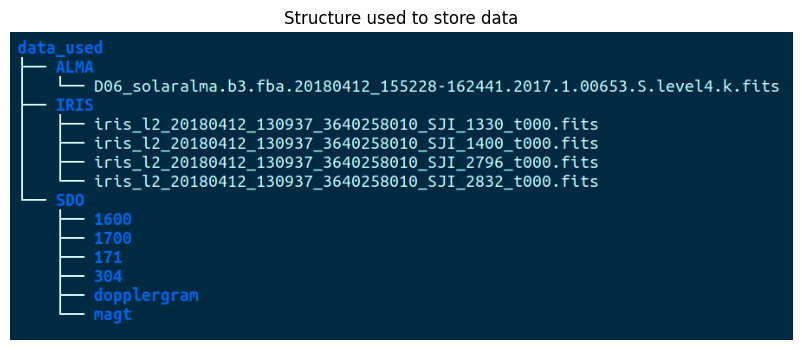

In [16]:
img = mpimg.imread('data_structure.png')
plt.figure(figsize=(17,4), dpi=100)
plt.title('Structure used to store data')
plt.imshow(img)
plt.axis('off') 
plt.show()

### **Data preparation** 

The alignment method proposes aligning the images with respect to solar north. `ALMA` image are tilted with respect to solar north, in this example the `D06` region is tilted -26.1446 degrees. Sometimes `SDO` images are tilted -180 degrees, it is recommended to rotate them using sunpy to preserve the header information. The `IRIS` images are already aligned with respect to solar north

## **Reading ALMA DATA** 

In [8]:
path_files_telescopes = '/media/javier/SSD_2/OtrasRegiones/D06/'
#  Path where ALMA images were saved.
path_ALMA=glob.glob(path_files_telescopes+"ALMA/*.fits")
file= path_ALMA[0]

almacube, header, timesec, timeutc, beammajor, beamminor, beamangle = sap.read(file,timeout=True,beamout=True,
                                                                               HEADER=True,SILENT=False,fillNan=True)
## ALMA DATA ARE TILTED, ROTATING ALMA IMAGES TO ALING WITH SOLAR NORTH 
alma_rote= sap.fun_alma_rotate(almacube, header['SOLAR_P'])


---------------------------------------------------
--------------- SALAT READ part of ----------------
-- Solar Alma Library of Auxiliary Tools (SALAT) --

Reading ALMA cube



100%|██████████| 1608/1608 [00:01<00:00, 1039.45it/s]


---------------------------------------------------
--------------- SALAT INFO part of ----------------
-- Solar Alma Library of Auxiliary Tools (SALAT) --


----------------------------------------------
| Data feat.: 
----------------------------------------------
|  ALMA BAND:  3
|  Obs. Date:  2018-04-12
|  ALMA proj:  2017.1.00653.S
|  Pix. Unit:  K
|  Pix. Size:  0.3  arcsec.
|  Beam mean:  2.15798  arcsec
|  FOV. diam:  notcomputed
----------------------------------------------
| Data range 
----------------------------------------------
|  Min =  5260.81054688  Kelvin
|  Max =  10677.8203125  Kelvin
----------------------------------------------

Done!
Rotating ALMA cube


100%|██████████| 1608/1608 [00:12<00:00, 127.77it/s]


rotate angle -26.1446


## **Reading IRIS data** 

In [9]:
# IRIS IMAGES ARE ORIENTED IN THE SOLAR NORTH DIRECTION AND DO NOT REQUIERE ROTATION
path_iris=glob.glob(path_files_telescopes+'IRIS/*.fits') #  Path where IRIS images were saved.
iris_2796= fits.open(path_iris[3])
iris_2796

[<astropy.io.fits.hdu.image.PrimaryHDU object at 0x7a09659020a0>, <astropy.io.fits.hdu.image.ImageHDU object at 0x7a0965872400>, <astropy.io.fits.hdu.table.TableHDU object at 0x7a0965872700>]

# **Align ALMA with IRIS Images** 

Aligns IRIS observations with ALMA data, scaling IRIS images to match ALMA resolution and computing correlations.

To carry out this task we used this function  `align_iris_with_alma` its parameters are:

**Parameters**:
- `iris_fits_file (fits object)` : FITS file containing IRIS data.
- `timeutc_alma (list)         ` : Time range for ALMA observations.
- `alma_cube (array)           ` : ALMA data cube.
- `alma_resolution (float)     ` : Resolution of ALMA data (arcsec).
- `method (str)                ` : Method to use for correlation analysis ('pearson' or 'ssim').
- `plot_results (bool)         ` : Whether to plot the results of the alignment.

**Returns**:
- `tuple`: Contains max X correlation, max Y correlation, initial position in IRIS array, 
  final position in IRIS array, correlation matrix.


The alignment method performs both spatial and temporal alignment. The frames compared are those that were co-observed by both instruments. However, when downloading IRIS data, there are frames that were not co-observed, so the UTC time information at which each frame was observed is used. For ALMA, this information is provided through the `timeutc` field. For IRIS, it is necessary to create a vector with the initial observation time and the corresponding cadence. This process is carried out internally by the `align_iris_with_alma` function.

In [10]:
print('How ALMA timeutc looks like:', timeutc[0:3])
print( 'ALMA shape = ', alma_rote.shape)
print('IRIS dara ImageHDU:',iris_2796)

How ALMA timeutc looks like: [datetime.datetime(2018, 4, 12, 15, 52, 31, 992187)
 datetime.datetime(2018, 4, 12, 15, 52, 33)
 datetime.datetime(2018, 4, 12, 15, 52, 34, 7812)]
ALMA shape =  (1608, 253, 253)
IRIS dara ImageHDU: [<astropy.io.fits.hdu.image.PrimaryHDU object at 0x7a09659020a0>, <astropy.io.fits.hdu.image.ImageHDU object at 0x7a0965872400>, <astropy.io.fits.hdu.table.TableHDU object at 0x7a0965872700>]


|-----------Aligning ALMA with IRIS 2796.0 images----------|
scale_factor: 0.5545
Rescaling IRIS Image...


100%|██████████| 950/950 [00:03<00:00, 259.48it/s]


Old IRIS VECTOR (950, 774, 735) New IRIS VECTOR (950, 429, 408)
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________
________________________________________________________________________
t_0 position in the IRIS array: 266 | t_f position in the IRIS array: 319
Warning!  Perhaps SDO FoV is too large. You are calculating 26928 pearson coefficients.
|----Estimating Pearson coefficients----|


________________________________________________________________________
x_max_pearson=367.8990081154193 | y_max_pearson=375.1127141568981 | r=0.5189137069365268


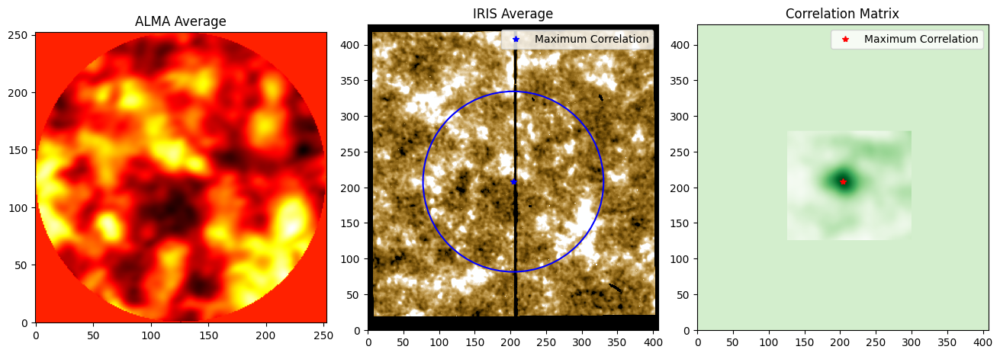

In [11]:
alma_pix_size = header['CDELT1A'] # ALMA PIXEL SIZE (0.3 arcsec for D06 observation)
# alma_rote == ALMA images aligned to solar north 

"""
* matrix_iris_sdo_sim--->Corelation matrix

* Within the IRIS data cube, the labels IRIS_2796_n_0 and IRIS_2796_n_f:  Specify the positions within the 
                                                                          image vector where the frames that were co-observed 
                                                                          by ALMA and IRIS begin and end.

* x_max_pearson_2796, y_max_pearson_2796: Pixel positions in the IRIS data cube (in the frames that were co-observed) 
                                          for which the IRIS and ALMA observations aligned
"""
x_max_pearson_2796, y_max_pearson_2796, IRIS_2796_n_0, IRIS_2796_n_f, matrix_iris_sdo_sim = sap.align_iris_with_alma(iris_2796, timeutc, alma_rote, alma_pix_size,  method='pearson', plot_results = True)




`x_max_pearson_2796`, `y_max_pearson_2796` pixe positions in the IRIS data cube (in co-observed frames) where IRIS and ALMA observations are aligned.   `NOTE`: The pixel position is based on the original IRIS images, with a pixel size of 0.16635 arcsec. In the plot below, the pixel size is 0.3 arcsec.

With the information from `x_max_pearson_2796, y_max_pearson_2796, IRIS_2796_n_0, IRIS_2796_n_f`, the user has the necessary data to crop the IRIS data and retain the co-observed region for further work. This process was not included in this version of the library, but below is the result of performing this process.
NOTE: For each ALMA alignment with SDO filters, an alignment is achieved; in our case, we took the average of the ALMA alignments with IRIS 2796, 1330, 1400. IRIS 2832 was discarded.

For more details on the process, see:
**Method article**: 'https://arxiv.org/abs/2404.04401',

**Second chapter of my master's thesis** for more details than in the paper: 'https://repositorio.unal.edu.co/handle/unal/85838'.

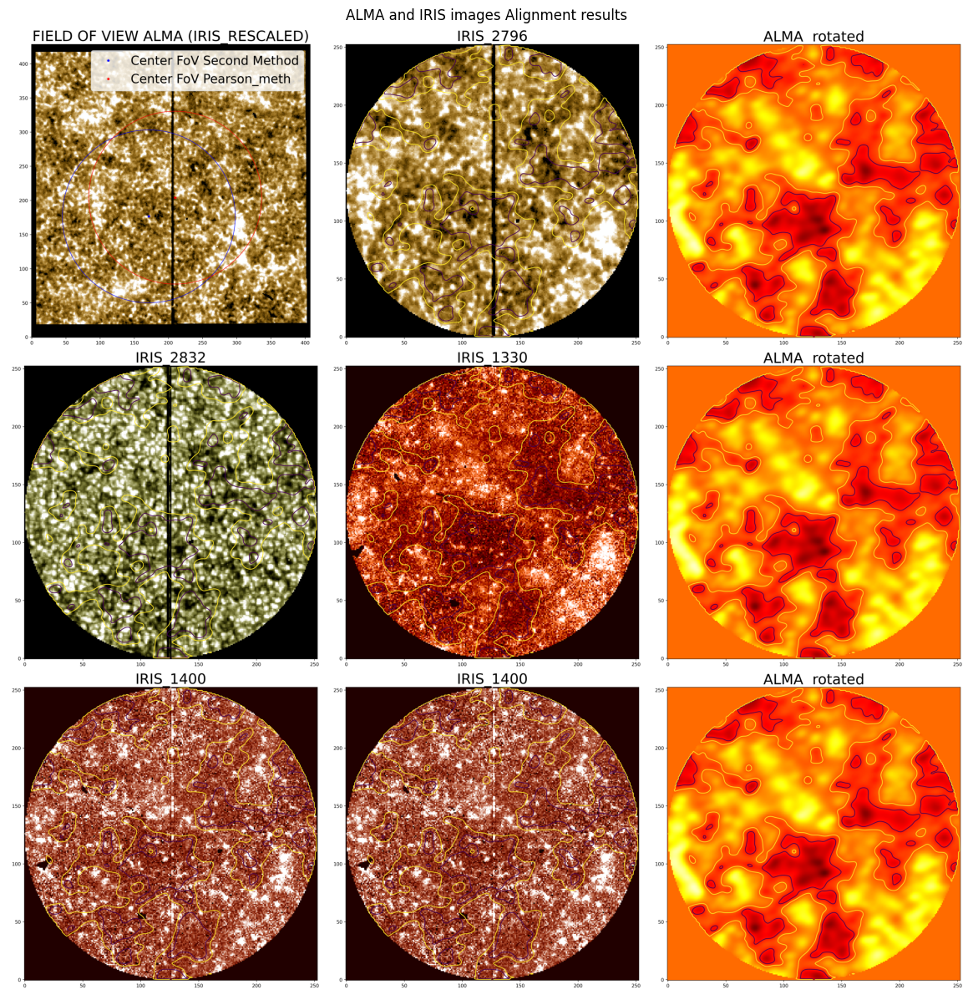

In [43]:
img = mpimg.imread('ALMA alignment with IRIS.png')
plt.figure(figsize=(15,15), dpi=100)
plt.title('ALMA and IRIS images Alignment results')
plt.imshow(img)
plt.axis('off') 
plt.show()

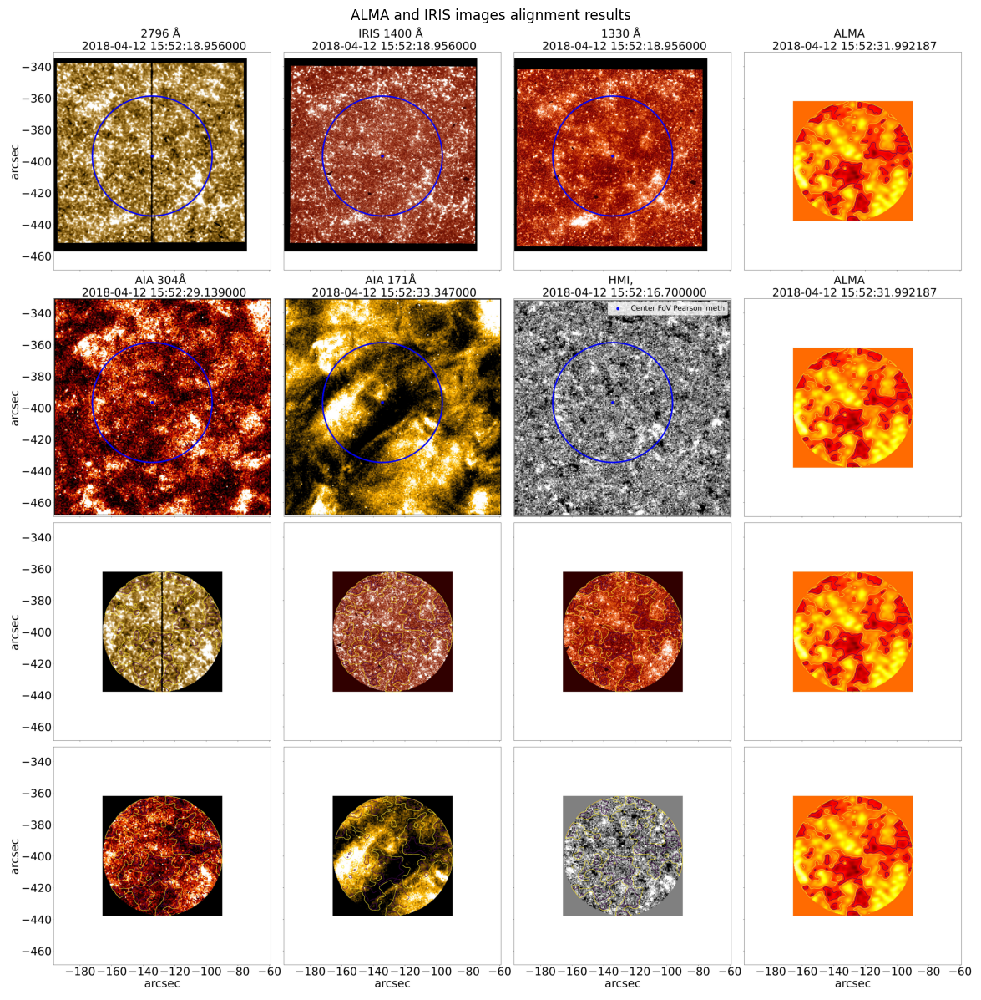

In [75]:
img = mpimg.imread('result_alingnment_with_iris.jpg')
plt.figure(figsize=(15,15), dpi=100)
plt.title('ALMA and IRIS images alignment results')
plt.imshow(img)
plt.axis('off') 
plt.show()

# **Aligning IRIS with SDO images**

###  In some cases, SDO images are TILTED -180 degrees and should be rotated to align with solar north.  To do this, it is recommended to use SunPy to rotate the data array and preserve the header metadata.



Aligns IRIS image data with SDO image data by rescaling the IRIS images and calculating
the correlation or similarity with corresponding SDO images to find the best alignment. 

We used the function `align_iris_with_sdo` to do the alignment of IRIS and SDO images, its parameters are: 

**Parameters**:

* `sdo_file (np.ndarray)     `: Array of frames from the SDO/AIA, loaded from a .npy file.
* `iris_data (np.ndarray)    `: Data cube from the IRIS database.
* `iris_resolution (float)   `: Spatial resolution of the IRIS images.
* `time_vec_iris (np.ndarray)`: Timestamps for each frame in the IRIS data cube.
* `time_vec_sdo (np.ndarray) `: Timestamps for each frame in the SDO data cube.
* `time_vec_alma (np.ndarray)`: Timestamps for each frame in the ALMA data cube.
* `path_img_crop (str)       `: File path to the directory containing cropped images.
* `method (str)              `: Method used for alignment ('pearson', 'ssim'). Default is 'pearson'.
* `plot_results (bool)       `: If True, plot the alignment results. Default is True.

**Returns**: Estimated helioprojective coordinates (Tx, Ty) of the center of the IRIS matrix.


In [13]:
#--------------------------------------------------------------------------------------------
#-------------------------- Inputs Used in align_iris_with_sdo function ---------------------
#--------------------------------------------------------------------------------------------
df_resolution = { 'AIA94'  : 0.600109,'AIA131' : 0.600698, 
                  'AIA171' : 0.599489,'AIA193' : 0.600714,
                  'AIA211' : 0.600758,'AIA304' : 0.600165,
                  'AIA335' : 0.600737,'AIA1600': 0.609373,
                  'AIA1700': 0.612898, 'HMI'   : 0.504349 }


# URL where the downloaded AIA snapshots are. (.fits files)
path_sdo=path_files_telescopes+'SDO/{}/crop_and_rotate/*.fits'

aia_wavelength = 304 # AIA 304Å

#Creating vector with AIA observation matrices (.array) and UTC time vector
data_304 ,  time_304  = sap.create_data_cube(path_sdo.format(aia_wavelength)   ,'aia')

# IRIS DATA CUBE DOES NOT PROVIDE TIMEUTC VECTOR, IT SHOULD BE CREATED
time_vec_iris = sap.creating_time_vector(iris_2796) 


print('Data cube shape:', data_304.shape)
print('Data time shape:', time_304.shape)
print('_______________________________________________________________________')
print('_______________________________________________________________________')
print('AIA Time      UTC:' , time_304[0:2]     )
print('AIA Data Cube UTC:' , data_304[0:2]     )
print('IRIS Time     UTC:' , time_vec_iris[0:2])
print('How ALMA timeutc looks like:', timeutc[0:3])
iris_pixel_size = iris_2796[0].header['CDELT2'] # IRIS pixel size 0.16635 arcsec
print('_______________________________________________________________________')

#path where all the .fits files of the SDO filter that you want to align are located
# ALIGNING IRIS with SDO Images 
print('Path where all the .fits files of the SDO filter that you want to align are located',path_sdo.format(aia_wavelength))

|------Doing AIA cubic------|
167


dirs: 100%|██████████| 167/167 [00:00<00:00, 251.34it/s]

All frame has the same shape
Data cube shape: (167, 230, 230)
Data time shape: (167,)
_______________________________________________________________________
_______________________________________________________________________
AIA Time      UTC: [datetime.datetime(2018, 4, 12, 15, 52, 5, 132000)
 datetime.datetime(2018, 4, 12, 15, 52, 17, 132000)]
AIA Data Cube UTC: [[[ 0.  0.  0. ...  1.  1.  0.]
  [ 0.  3.  4. ...  7.  6.  0.]
  [ 0.  5.  6. ...  7.  4.  0.]
  ...
  [ 0.  6.  8. ... 14. 15.  2.]
  [ 0. 11.  8. ... 11.  9.  1.]
  [ 0.  2.  1. ...  0.  0.  0.]]

 [[ 0.  0.  0. ...  1.  1.  0.]
  [ 1.  3.  2. ... 10.  6.  0.]
  [ 1.  7.  6. ...  7.  5.  0.]
  ...
  [ 0.  7. 11. ... 14. 16.  2.]
  [ 0.  8. 11. ... 10. 12.  1.]
  [ 0.  1.  1. ...  0.  0.  0.]]]
IRIS Time     UTC: [datetime.datetime(2018, 4, 12, 13, 9, 37, 820000)
 datetime.datetime(2018, 4, 12, 13, 10, 14, 516000)]
How ALMA timeutc looks like: [datetime.datetime(2018, 4, 12, 15, 52, 31, 992187)
 datetime.datetime(2018,

Rescaling IRIS images with scale factor: 0.27717377305480334
Initial shape: (167, 230, 230) | Rescaled shape: (950, 215, 204)
______________________________________________________
t_0_SDO = 2018-04-12 15:52:29.139000
t_0_IRIS= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_SDO = 2018-04-12 16:24:41.122000
t_0_IRIS= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 2 | posicion_n_f: 163
______________________________________________________
______________________________________________________
t_0_SDO = 2018-04-12 15:52:18.956000
t_0_IRIS= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_SDO = 2018-04-12 16:24:43.844000
t_0_IRIS= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________


Best alignment (Tx, Ty) in arcsec: -132.4154936808627, -398.01779418564695


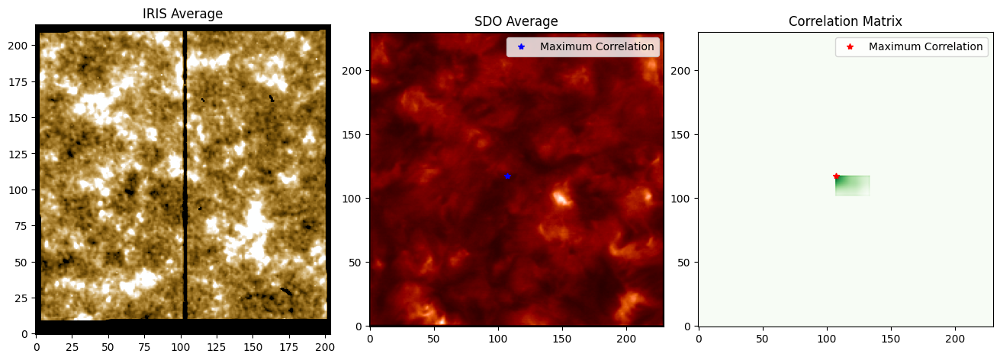

In [14]:
x_max_similarity_cord_304  ,y_max_similarity_cord_304  =  sap.align_iris_with_sdo(np.abs(data_304) , iris_2796[0].data,  iris_pixel_size ,time_vec_iris, time_304 , timeutc, path_sdo.format(aia_wavelength))


###  **Note** 

The images of the results shown below were generated with crops from SDO with a field of view (FoV) larger than previously specified. The issue with using these data is that, when comparing to ALMA's FoV, which is much smaller than SDO's, the program's runtime will be extremely long. In our work, we suggest cropping SDO with a FoV 1.8 times larger than ALMA’s FoV.

The function `align_iris_with_sdo` outputs the helioprojective coordinates where the images co-observed by IRIS and SDO are aligned. Using the library from astropy.coordinates import `SkyCoord`, one can find the corresponding pixel where the images spatially align (associated with helioprojective coordinates). Regarding the temporal alignment of the images, for SDO images, there is a sequence of .fits files stored at this path `path_sdo`. For temporal alignment, one must identify which files were co-observed by SDO-IRIS. The function `align_iris_with_sdo` does not return this value, but it does print the values `index_t_0, index_t_f` that help identify which frames stored in path_sdo were co-observed. Thus, the function also prints the values `index_t_0, index_t_f` for which, in the IRIS data cube, the data were co-observed. Using this information, one can select the SDO and IRIS data that were co-observed, and work with the data for the particular objective the user has. Below is the result of the alignment.

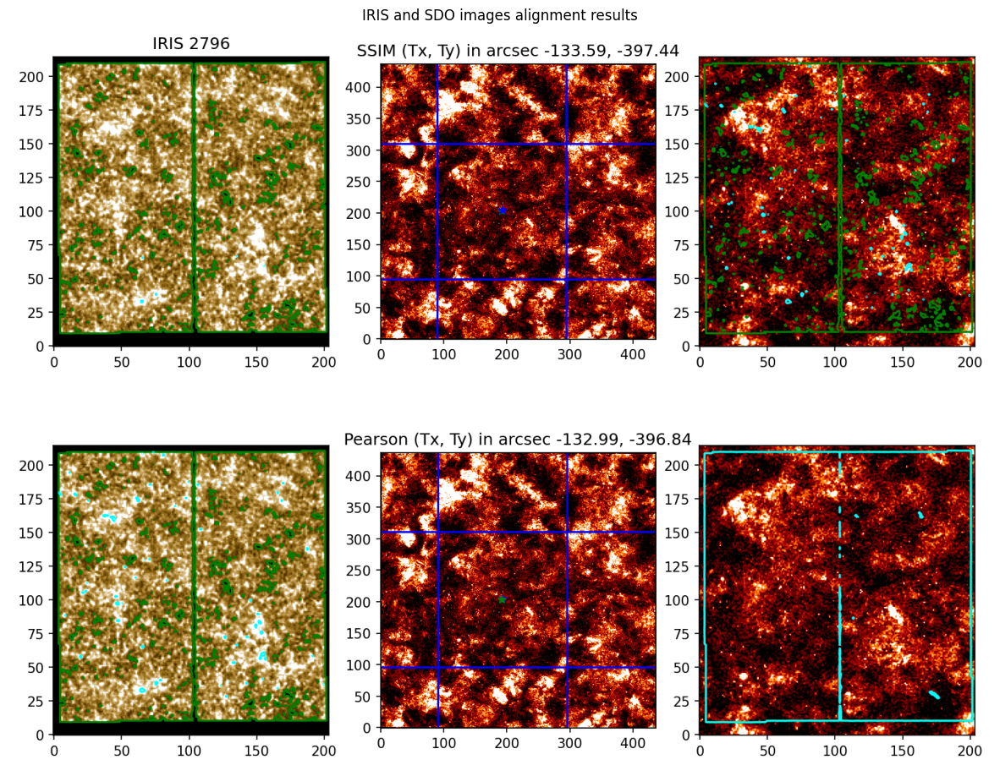

In [15]:
img = mpimg.imread('IRIS_alignment_with_SDO.png')
plt.figure(figsize=(15,15), dpi=100)
plt.title('IRIS and SDO images alignment results')
plt.imshow(img)
plt.axis('off') 
plt.show()

## Aligning ALMA with SDO images

###  In some cases, SDO images are TILTED -180 degrees and should be rotated to align with solar north.  To do this, it is recommended to use SunPy to rotate the data array and preserve the header metadata.



Aligns Solar Dynamics Observatory (SDO) data with Atacama Large Millimeter/submillimeter Array (ALMA) observations.
This function aligns data from SDO and ALMA using cross-correlation techniques specified by the method argument. 
It rescales the resolution of SDO data to match that of ALMA, selects the relevant observation window, 
and computes the alignment using either Pearson correlation or Structural Similarity Index (SSIM).

**Parameters**:

* `sdo_file (list or array)`: Collection of SDO images to be processed.
* `time_filter (list)      `: Two-element list defining the start and end times for filtering the observations.
* `time_alma (list)        `: Time stamps corresponding to ALMA observations to align with the SDO data.
* `alma_cube (np.array)    `: Data cube containing ALMA observations.
* `alma_resolution (float) `: Spatial resolution of the ALMA observations.
* `path_mapMap (str)       `: Path pattern to locate FITS files containing SDO data.
* `method (str, optional)  `: Method to use for calculating alignment; supported values are 'pearson' for Pearson 
                              correlation, or 'ssim' for Structural Similarity Index. Default is 'pearson'.
    
**Returns**:

`tuple`: Contains helioprojective coordinates (Tx, Ty in arcseconds) of the alignment 
point, and the starting and ending indexes of the selected observation window in SDO data.


In [21]:

df_resolution = { 'AIA94'  : 0.600109,'AIA131' : 0.600698, 
                  'AIA171' : 0.599489,'AIA193' : 0.600714,
                  'AIA211' : 0.600758,'AIA304' : 0.600165,
                  'AIA335' : 0.600737,'AIA1600': 0.609373,
                  'AIA1700': 0.612898, 'HMI'   : 0.504349 }


# URL where the downloaded AIA snapshots are. (.fits files)
path_sdo=path_files_telescopes+'SDO/{}/crop_and_rotate/*.fits'

aia_wavelength = 304 # AIA 304Å

#Creating vector with AIA observation matrices (.array) and UTC time vector
data_304 ,  time_304  = sap.create_data_cube(path_sdo.format(aia_wavelength)   ,'aia')

alma_pix_size = header['CDELT1A'] # ALMA PIXEL SIZE (0.3 arcsec for D06 observation)

print('Data cube shape:', data_304.shape)
print('Data time shape:', time_304.shape)
print('_____________________________________________________________________________________________')

print('Path where all the .fits files of the SDO filter that you want to align are located',path_sdo.format(aia_wavelength))



|------Doing AIA cubic------|
167


dirs: 100%|██████████| 167/167 [00:00<00:00, 239.27it/s]

All frame has the same shape
Data cube shape: (167, 230, 230)
Data time shape: (167,)
_____________________________________________________________________________________________
Path where all the .fits files of the SDO filter that you want to align are located /media/javier/SSD_2/OtrasRegiones/D06/SDO/304/crop_and_rotate/*.fits


|-----------------SDO/AIA-304_THIN-------------------|
scale_factor: 2.0005500300000003
Rescaling AIA  images


  0%|          | 0/167 [00:00<?, ?it/s]

100%|██████████| 167/167 [00:00<00:00, 351.34it/s]


________________________________________________________________________
initial shape: (167, 230, 230) | rescaled shape: (167, 460, 460)
______________________________________________________
t_0_ALMA = 2018-04-12 15:52:29.139000
t_0_SDO= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_ALMA = 2018-04-12 16:24:41.122000
t_0_SDO= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 2 | posicion_n_f: 163
______________________________________________________
Warning! Perhaps SDO FoV is too large. You are calculating 43264 Pearson coefficients.


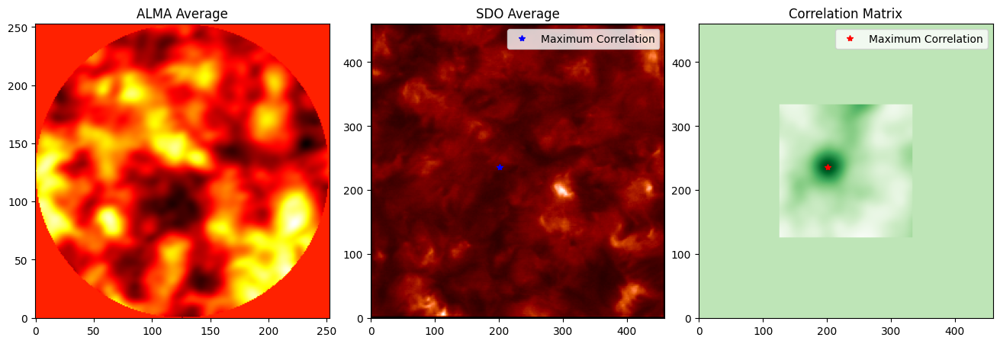

________________________________________________________________________
x_max_pearson= 201 | y_max_pearson= 236 | r= 0.5569230003414296
________________________________________________________________________
|-----Helioprojective Coordinates-------|
Pearson: (Tx, Ty) in arcsec -136.33314798097126 -397.4370975997229


In [22]:
Tx_pearson, Tx_pearson, t0_sdo, tf_sdo = sap.align_alma_with_sdo(data_304, time_304, timeutc, alma_rote, alma_pix_size,path_sdo.format(aia_wavelength), method='pearson', plot_results=True)

# **RESULTS**

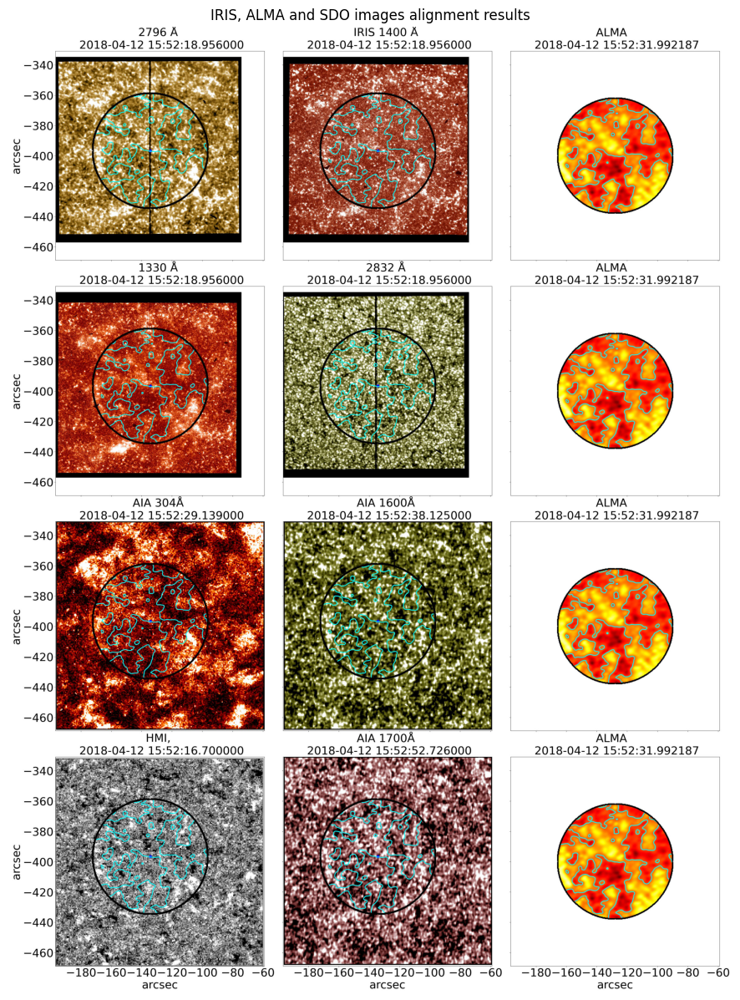

In [82]:
img = mpimg.imread('result_alingnment_with_iris_new_plot_dpi_100.jpg')
plt.figure(figsize=(15,15), dpi=100)
plt.title('IRIS, ALMA and SDO images alignment results')
plt.imshow(img)
plt.axis('off') 
plt.show()

## **NOTE**
In the reference article of this work, the IRIS images were aligned with those of ALMA and then those of IRIS with SDO. The result is almost the same as directly aligning ALMA images with SDO and aligning IRIS with SDO. The results are shown below.

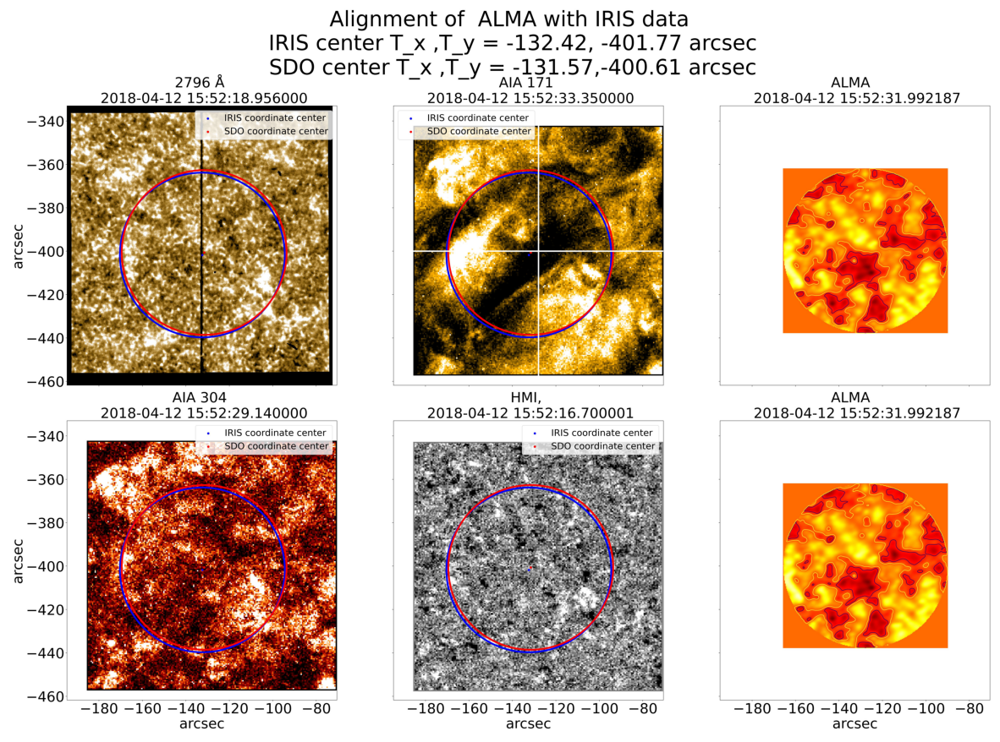

In [84]:
img = mpimg.imread('ALMA, IRIS alignment with SDO_comparison.jpg')
plt.figure(figsize=(15,15), dpi=100)
#plt.title('IRIS, ALMA and SDO images alignment results')
plt.imshow(img)
plt.axis('off') 
plt.show()